In [18]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision.ops import nms
import imageio
import numpy as np
import os

# **Compute Dense Optical Flow**
We used Farneback's method in opencv

In [19]:
def compute_flow(frame1, frame2):
    # Convert frames to grayscale
    gray1 = cv2.cvtColor(frame1, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(frame2, cv2.COLOR_BGR2GRAY)

    # Blur images for better flow calculation
    gray1 = cv2.GaussianBlur(gray1, (3,3), sigmaX=5)
    gray2 = cv2.GaussianBlur(gray2, (3,3), sigmaX=5)

    # Compute optical flow using Farneback’s method
    flow = cv2.calcOpticalFlowFarneback(gray1, gray2, None, 0.5, 10, 15, 5, 5, 1.1, 0)
    return flow


In [20]:
def get_flow_viz(flow):
    hsv = np.zeros((flow.shape[0], flow.shape[1], 3), dtype=np.uint8)
    hsv[..., 1] = 255

    # Compute magnitude and angle of flow
    mag, ang = cv2.cartToPolar(flow[..., 0], flow[..., 1])
    hsv[..., 0] = ang * 180 / np.pi / 2  # Angle in degrees
    hsv[..., 2] = cv2.normalize(mag, None, 0, 255, cv2.NORM_MINMAX)  # Normalize magnitude

    # Convert HSV to RGB for display
    rgb = cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)
    return rgb, mag

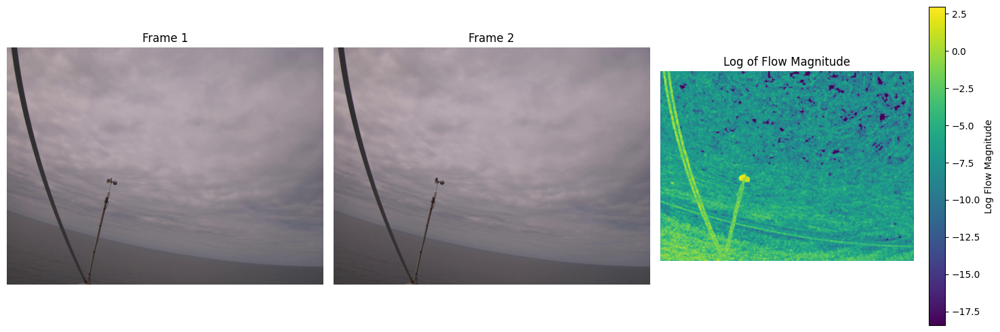

In [21]:
image_path1 = './Sequence-1.jpg'
image_path2 = './Sequence-2.jpg'
frame1 = cv2.imread(image_path1)
frame2 = cv2.imread(image_path2)

# Compute optical flow
flow = compute_flow(frame1, frame2)

# Get flow visualization and magnitude
flow_viz, mag = get_flow_viz(flow)

# Compute log of the magnitude (adding a small constant to avoid log(0))
log_mag = np.log(mag + 1e-8)

# Plot the results
plt.figure(figsize=(15, 5))

# Display the first frame
plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(frame1, cv2.COLOR_BGR2RGB))
plt.title("Frame 1")
plt.axis("off")

# Display the second frame
plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(frame2, cv2.COLOR_BGR2RGB))
plt.title("Frame 2")
plt.axis("off")

# Display the log of the flow magnitude
plt.subplot(1, 3, 3)
plt.imshow(log_mag, cmap="viridis")
plt.colorbar(label="Log Flow Magnitude")
plt.title("Log of Flow Magnitude")
plt.axis("off")

plt.tight_layout()
plt.show()

- compute_flow function calculates the dense optical flow between the two frames.
- get_flow_viz function generates a color-coded image of the optical flow and computes the magnitude of the flow vectors.
- Logarithmic magnitude visualization: We take the log of the magnitude to enhance visibility, especially for small values, and display it with a color map.

- The magnitude represents the amount of movement (or displacement) between corresponding points in consecutive frames : Low magnitude (values near -17.5 in the log scale) indicates areas with little to no motion and high magnitude (values near 2.5 in the log scale): Indicates areas with significant motion.

# **Get the Motion Mask**
We will need to apply a threshold to the optical flow and obtain a binary motion mask. In practice we will use Blurring and Morphological Operations to improve the quality of the motion mask.

In [22]:
def get_motion_mask(flow_mag, motion_thresh=1, kernel=np.ones((7,7), dtype=np.uint8)):
    motion_mask = np.uint8(flow_mag > motion_thresh) * 255
    motion_mask = cv2.erode(motion_mask, kernel, iterations=1)
    motion_mask = cv2.morphologyEx(motion_mask, cv2.MORPH_OPEN, kernel, iterations=1)
    motion_mask = cv2.morphologyEx(motion_mask, cv2.MORPH_CLOSE, kernel, iterations=3)
    return motion_mask


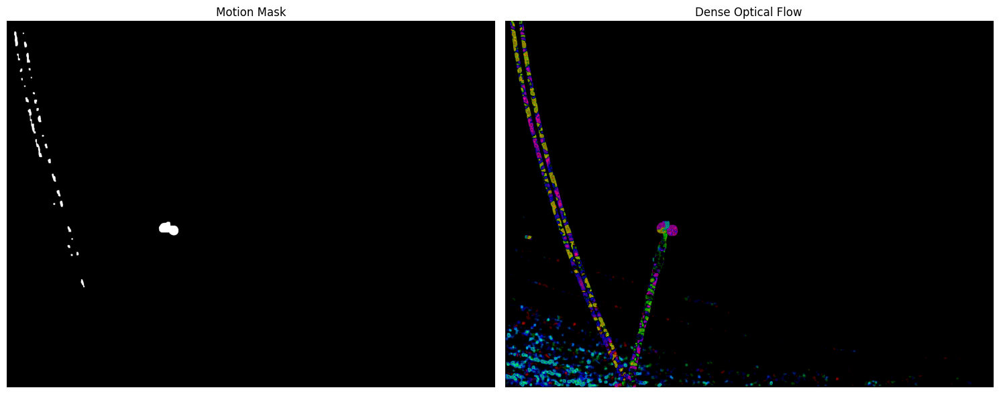

In [23]:
# Compute Dense Optical Flow
flow = compute_flow(frame1, frame2)

# Separate flow into magnitude and angle
mag, ang = cv2.cartToPolar(flow[..., 0], flow[..., 1])

# Get optical flow visualization
rgb, _ = get_flow_viz(flow)

# Define variable motion threshold based on image height (e.g., 1080 pixels)
min_thresh = 0.3
max_thresh = 1.0
motion_thresh = np.c_[np.linspace(min_thresh, max_thresh, mag.shape[0])].repeat(mag.shape[1], axis=-1)

# Get motion mask with position-dependent threshold
mask = get_motion_mask(mag, motion_thresh=motion_thresh)

# Display the mask and the dense optical flow visualization
fig, ax = plt.subplots(1, 2, figsize=(15, 7))
ax[0].imshow(mask, cmap='gray')
ax[0].set_title("Motion Mask")
ax[0].axis("off")

ax[1].imshow(rgb * 50)  # Scaling to make flow visualization more visible
ax[1].set_title("Dense Optical Flow")
ax[1].axis("off")

plt.tight_layout()
plt.show()

- Dense optical flow calculates the displacement (movement) of every pixel between two consecutive frames. This means it gives a detailed map of both the direction and the speed of motion across the entire image.
- The motion mask, on the other hand, only highlights regions of significant motion by thresholding the optical flow magnitude. It simplifies the detailed flow information into a basic mask that shows only the areas that are moving and ignores everything else.

The motion mask is useful for identifying general movement but captures unintended background motion, failing to isolate the bird’s specific motion . Whereas the dense optical flow provides a more precise analysis that accurately distinguishes the bird’s unique movement from other subtle background motions.


# **Get detections**
We leverage optical flow-based contour detection to identify and refine bounding boxes around moving objects, using flow magnitude and angle consistency for precise detections.

In [24]:
def get_contour_detections(mag, ang, angle_thresh=1, mag_thresh=0.5, area_thresh=100):
    """ Obtain detections from contours based on the optical flow magnitude and angle.
        Inputs:
            mag - Optical flow magnitude
            ang - Optical flow angle
            angle_thresh - threshold for flow angle standard deviation
            mag_thresh - threshold for flow magnitude to consider motion
            area_thresh - minimum contour area for a valid detection
        Outputs:
            detections - array of proposed detection bounding boxes and scores
                         [[x1, y1, x2, y2, score]]
    """
    # Threshold the magnitude to get areas of significant motion
    motion_mask = np.uint8(mag > mag_thresh) * 255
    contours, _ = cv2.findContours(motion_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    angle_thresh = angle_thresh * ang.std()
    detections = []

    for cnt in contours:
        # Get bounding box and area of contour
        x, y, w, h = cv2.boundingRect(cnt)
        area = w * h

        # Check flow angle consistency within the contour
        mask = np.zeros_like(motion_mask)
        cv2.drawContours(mask, [cnt], -1, 255, -1)
        flow_angle = ang[mask == 255]

        # Filter based on area and angle consistency
        if area > area_thresh and flow_angle.std() < angle_thresh:
            detections.append([x, y, x + w, y + h, area])

    return np.array(detections)

In [25]:
def non_max_suppression(bboxes, scores, threshold=0.3):
    # Convert bounding boxes to tensor for PyTorch NMS
    bboxes_tensor = torch.tensor(bboxes, dtype=torch.float32)
    scores_tensor = torch.tensor(scores, dtype=torch.float32)
    keep = nms(bboxes_tensor, scores_tensor, threshold)
    return bboxes_tensor[keep].numpy().astype(int)


In [26]:
def get_detections(frame1, frame2, mag_thresh=0.5, bbox_thresh=300, nms_thresh=0.1, angle_thresh=1):
    """ Main function to get detections via Optical Flow-based contour detection
        Inputs:
            frame1 - Grayscale frame at time t
            frame2 - Grayscale frame at time t + 1
            mag_thresh - Minimum magnitude threshold for motion
            bbox_thresh - Minimum contour area threshold
            nms_thresh - IOU threshold for Non-Maximal Suppression
            angle_thresh - Threshold for angle consistency within a contour
        Outputs:
            detections - list with bounding box locations of all detections
                bounding boxes are in the form of: (xmin, ymin, xmax, ymax)
    """
    # Compute optical flow
    flow = compute_flow(frame1, frame2)

    # Separate into magnitude and angle
    mag, ang = cv2.cartToPolar(flow[..., 0], flow[..., 1])

    # Get initial detections based on optical flow contours
    detections = get_contour_detections(mag, ang, angle_thresh=angle_thresh, mag_thresh=mag_thresh, area_thresh=bbox_thresh)

    # Separate bounding boxes and scores for non-maximal suppression
    bboxes = detections[:, :4]
    scores = detections[:, -1]

    # Perform Non-Maximal Suppression on initial detections
    return non_max_suppression(bboxes, scores, threshold=nms_thresh)


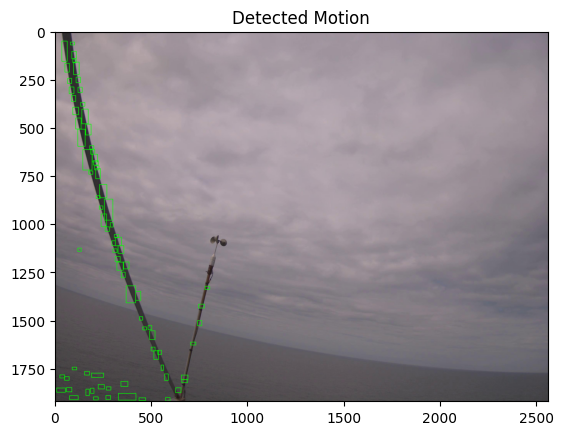

In [27]:

# Load two consecutive frames
frame1 = cv2.imread(image_path1)
frame2 = cv2.imread(image_path2)

# Get detections
detections = get_detections(frame1, frame2)

# Draw bounding boxes
for bbox in detections:
    x1, y1, x2, y2 = bbox
    cv2.rectangle(frame1, (x1, y1), (x2, y2), (0, 255, 0), 2)

# Display results
plt.imshow(cv2.cvtColor(frame1, cv2.COLOR_BGR2RGB))
plt.title("Detected Motion")
plt.show()


After adjusting thresholds, we successfully detected the bird's movement, but background elements like the sea are still picked up, showing the need for further refinement.

# **Visualisation on Multiple Frames**


In [28]:
# Visualize and save frame with detections
def visualize_frame_with_detections(frame, detections):
    frame_with_detections = frame.copy()
    for bbox in detections:
        x1, y1, x2, y2 = bbox
        cv2.rectangle(frame_with_detections, (x1, y1), (x2, y2), (0, 255, 0), 2)
    return frame_with_detections

In [29]:
def generate_gif(folder_path, frame_start, frame_end, frame_pattern, output_gif, mag_thresh=0.5, bbox_thresh=300, nms_thresh=0.1, angle_thresh=1):
    frame_files = [
        f"{folder_path}/{frame_pattern.format(frame=i)}.jpg"
        for i in range(frame_start, frame_end + 1)
    ]

    processed_frames = []
    all_detections = []  # To store detections for each frame

    for i in range(len(frame_files) - 1):
        frame1_path = frame_files[i]
        frame2_path = frame_files[i + 1]

        frame1 = cv2.imread(frame1_path)
        frame2 = cv2.imread(frame2_path)

        if frame1 is None or frame2 is None:
            print(f"Skipping missing frames: {frame1_path}, {frame2_path}")
            all_detections.append([])  # Append an empty list for skipped frames
            continue

        # Compute optical flow
        flow = compute_flow(frame1, frame2)
        mag, ang = cv2.cartToPolar(flow[..., 0], flow[..., 1])

        # Get initial detections
        detections = get_contour_detections(mag, ang, angle_thresh, mag_thresh, bbox_thresh)

        # Apply Non-Maximal Suppression
        if len(detections) > 0:
            bboxes = detections[:, :4]
            scores = detections[:, -1]
            detections = non_max_suppression(bboxes, scores, threshold=nms_thresh)
        else:
            detections = []  # No detections for this frame

        # Append detections to the list
        all_detections.append(detections)  # Convert to a list for easier storage

        # Visualize detections
        frame_with_detections = visualize_frame_with_detections(frame1, detections)

        # Concatenate original and processed frames
        processed_frames.append(frame_with_detections)

    # Save frames as a GIF
    gif_frames = [cv2.cvtColor(frame, cv2.COLOR_BGR2RGB) for frame in processed_frames]
    
    # Save the GIF in the output directory
    output_gif_path = os.path.join("output_gifs", output_gif)
    imageio.mimsave(output_gif_path, gif_frames, fps=5)
    print(f"GIF saved at {output_gif_path}")
    print(f"GIF saved at {output_gif}")

    return all_detections


In [30]:

# Parameters
folder_path = "../DATASET_SENSEA/images"
frame_pattern = "sequence=85_video-20220513_053645-02_frame={frame}"
frame_start = 6700
frame_end = 6706
output_gif = "detections9.gif"

# Generate GIF
detections = generate_gif(folder_path, frame_start, frame_end, frame_pattern, output_gif)

GIF saved at output_gifs\detections9.gif
GIF saved at detections9.gif


GIF saved at output_gifs\detections13.gif
GIF saved at detections13.gif


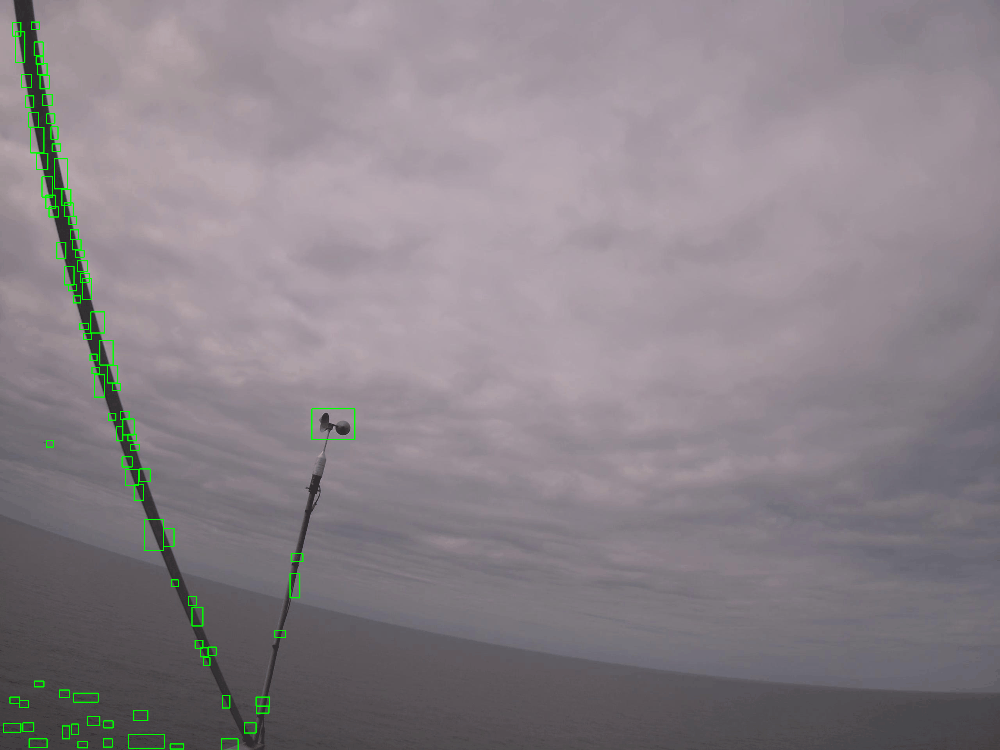

In [31]:
folder_path = "../DATASET_SENSEA/images"
frame_pattern = "sequence=1_video-20220511_132051-00_frame={frame}"
frame_start = 3720
frame_end = 3732
output_gif = "detections13.gif"
generate_gif(folder_path, frame_start, frame_end, frame_pattern, output_gif)
from IPython.display import Image
Image(filename="output_gifs/detections13.gif")

In [32]:
folder_path = "../DATASET_SENSEA/images"
frame_pattern = "sequence=2_video-20220511_132051-01_frame={frame}"
frame_start = 3745
frame_end = 3757
output_gif = "detections14.gif"
generate_gif(folder_path, frame_start, frame_end, frame_pattern, output_gif)

GIF saved at output_gifs\detections14.gif
GIF saved at detections14.gif


[array([[  61,  578, 2551, 1920],
        [ 576,  910,  753, 1027],
        [2266,  632, 2401,  771],
        [ 927, 1727, 1058, 1839],
        [ 560,  821,  682,  929],
        [  58,   74,  167,  188],
        [2440, 1146, 2559, 1245],
        [2492,  978, 2558, 1146],
        [ 744,  400,  805,  576],
        [ 148, 1056,  240, 1163],
        [ 787,  616,  847,  777],
        [ 441,  508,  547,  585],
        [1186,  635, 1288,  705],
        [2206,  560, 2294,  641],
        [2399, 1031, 2498, 1096],
        [ 675,  797,  760,  870],
        [1790,  543, 1908,  595],
        [ 720,  264,  772,  378],
        [1374,  605, 1435,  691],
        [1265,  668, 1320,  761],
        [2225, 1148, 2306, 1210],
        [   0, 1243,   66, 1315],
        [1089, 1738, 1151, 1810],
        [2160, 1114, 2262, 1156],
        [2114,  670, 2197,  719],
        [2105, 1288, 2168, 1349],
        [ 194,  887,  255,  948],
        [1153, 1845, 1230, 1892],
        [ 257,  815,  308,  885],
        [1050,

# **Evaluation of our Algorithm**


In [33]:
def load_yolo_annotations(annotation_path, img_width, img_height):
    """Load YOLO annotations and convert to absolute coordinates."""
    if not os.path.exists(annotation_path):
        print(f"Annotation file not found: {annotation_path}")
        return np.array([])  # Return empty array if annotation file doesn't exist

    with open(annotation_path, "r") as file:
        annotations = []
        for line in file.readlines():
            class_id, x_center, y_center, width, height = map(float, line.split())
            x_min = int((x_center - width / 2) * img_width)
            y_min = int((y_center - height / 2) * img_height)
            x_max = int((x_center + width / 2) * img_width)
            y_max = int((y_center + height / 2) * img_height)
            annotations.append([x_min, y_min, x_max, y_max])
    return np.array(annotations)

def compute_iou(box1, box2):
    """Compute Intersection over Union (IoU) between two bounding boxes."""
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    intersection = max(0, x2 - x1) * max(0, y2 - y1)
    area1 = (box1[2] - box1[0]) * (box1[3] - box1[1])
    area2 = (box2[2] - box2[0]) * (box2[3] - box2[1])
    union = area1 + area2 - intersection

    return intersection / union if union > 0 else 0

def evaluate_detections(detections, annotations, iou_threshold=0.2):
    """Evaluate detections against ground truth annotations for a single frame."""
    tp, fp, fn = 0, 0, 0
    matched = set()

    for det in detections:
        best_iou = 0
        best_gt_idx = -1

        for i, gt in enumerate(annotations):
            if i not in matched:
                iou = compute_iou(det, gt)
                if iou > best_iou:
                    best_iou = iou
                    best_gt_idx = i

        if best_iou >= iou_threshold:
            tp += 1
            matched.add(best_gt_idx)
        else:
            fp += 1

    fn = len(annotations) - len(matched)

    precision = tp / (tp + fp) if tp + fp > 0 else 0
    snr = tp / fp if fp > 0 else float('inf')

    return {"precision": precision, "snr": snr, "tp": tp, "fp": fp, "fn": fn}

def evaluate_all_frames(detection_results, folder_path, frame_pattern, frame_start, frame_end, img_width, img_height, iou_threshold=0.2):
    """
    Evaluate detection results against YOLO annotations across multiple frames.

    Parameters:
        detection_results - List of detections per frame.
        folder_path - Path to the folder containing YOLO annotation files.
        frame_pattern - Pattern of frame file names.
        frame_start, frame_end - Start and end frame numbers.
        img_width, img_height - Dimensions of the image.
        iou_threshold - IoU threshold for matching.

    Returns:
        Aggregated evaluation metrics: precision, snr, tp, fp, fn.
    """
    total_tp, total_fp, total_fn = 0, 0, 0

    for frame_idx, detections in enumerate(detection_results):
        frame_num = frame_start + frame_idx
        annotation_path = f"{folder_path}/{frame_pattern.format(frame=frame_num)}.txt"

        # Load ground truth annotations for the frame
        annotations = load_yolo_annotations(annotation_path, img_width, img_height)
        # Evaluate detections against annotations
        if len(annotations) > 0:
            metrics = evaluate_detections(detections, annotations, iou_threshold)
            total_tp += metrics['tp']
            total_fp += metrics['fp']
            total_fn += metrics['fn']
        else:
            total_fp += len(detections)  # If no annotations, all detections are false positives

    # Aggregate metrics
    precision = total_tp / (total_tp + total_fp) if total_tp + total_fp > 0 else 0
    snr = total_tp / total_fp if total_fp > 0 else float('inf')

    return {"precision": precision, "snr": snr, "tp": total_tp, "fp": total_fp, "fn": total_fn}


In [34]:

# Parameters

img_height, img_width = 1920, 2560  # Adjust these values to match your frame dimensions
folder_path = "../DATASET_SENSEA/images"
frame_pattern = "sequence=85_video-20220513_053645-02_frame={frame}"
frame_start = 6700
frame_end = 6706
output_gif = "detections7.gif"
detections= generate_gif(folder_path, frame_start, frame_end, frame_pattern, output_gif)
# Example detections (replace with your actual detection results)
# Format: List of detections for each frame (detections = [[x_min, y_min, x_max, y_max], ...])

# Evaluate all frames
results = evaluate_all_frames(detections, folder_path, frame_pattern, frame_start, frame_end, img_width, img_height)

# Print aggregated metrics
print("Aggregated Evaluation Metrics:")
print(f"Precision: {results['precision']:.2f}")
print(f"True Positives: {results['tp']}")
print(f"False Positives: {results['fp']}")
print(f"False Negatives: {results['fn']}")
print(f"Signal-to-Noise Ratio (SNR): {results['snr']:.2f}")


GIF saved at output_gifs\detections7.gif
GIF saved at detections7.gif
Aggregated Evaluation Metrics:
Precision: 0.02
True Positives: 6
False Positives: 280
False Negatives: 0
Signal-to-Noise Ratio (SNR): 0.02


In [35]:
folder_path = "../DATASET_SENSEA/images"
frame_pattern = "sequence=1_video-20220511_132051-00_frame={frame}"
frame_start = 3720
frame_end = 3732
output_gif = "detections11.gif"
img_height, img_width = 1920, 2560
detections = generate_gif(folder_path, frame_start, frame_end, frame_pattern, output_gif)
results = evaluate_all_frames(detections, folder_path, frame_pattern, frame_start, frame_end, img_width, img_height)
# Print aggregated metrics
print("Aggregated Evaluation Metrics:")
print(f"Precision: {results['precision']:.2f}")
print(f"True Positives: {results['tp']}")
print(f"False Positives: {results['fp']}")
print(f"False Negatives: {results['fn']}")
print(f"Signal-to-Noise Ratio (SNR): {results['snr']:.2f}")

GIF saved at output_gifs\detections11.gif
GIF saved at detections11.gif
Aggregated Evaluation Metrics:
Precision: 0.01
True Positives: 8
False Positives: 554
False Negatives: 4
Signal-to-Noise Ratio (SNR): 0.01


In [36]:
import os
import numpy as np

# Fonction pour sélectionner 12 frames au milieu de chaque séquence
def select_middle_frames(sequence_id, frame_files, num_frames=12, max_missing_frames=6):
    # Filtrer les frames de la séquence actuelle
    sequence_frames = sorted([
        file for file in frame_files if f"sequence={sequence_id}_" in file
    ])

    # S'assurer qu'il y a des frames dans cette séquence
    if not sequence_frames:
        print(f"Aucune frame trouvée pour sequence={sequence_id}")
        return [], 0

    # Trouver l'intervalle au milieu
    start_index = 0
    end_index = start_index + num_frames
    
    if len(sequence_frames) <= num_frames:
        return sequence_frames, len(sequence_frames)

    frame_indices = [
            int(file.split("frame=")[-1].split(".")[0]) for file in sequence_frames
        ]
    
    nv_frame_indices = sorted(frame_indices)
    
    while nv_frame_indices[end_index] - nv_frame_indices[start_index] != num_frames:
        start_index += 1
        end_index += 1

    return sequence_frames[start_index:end_index+1], num_frames

# Parcourir les séquences et évaluer l'algorithme
def evaluate_on_sequences(folder_path, num_sequences, N, num_frames_per_sequence=12, max_missing_frames=6): # N est tel que l'on prend une séquence sur N
    # Lister tous les fichiers d'images
    frame_files = sorted([f for f in os.listdir(folder_path) if f.endswith(".jpg")])

    all_detections = []
    all_results = []
    
    max_seq = min(N*num_sequences, 156)

    for sequence_id in range(1, max_seq + 1, N):
        
        print(f"Traitement de sequence={sequence_id}...")

        # Sélectionner les frames pour cette séquence
        selected_frames, nb_frames = select_middle_frames(sequence_id, frame_files, num_frames_per_sequence, max_missing_frames)
        
        # Extraire les indices des frames
        frame_indices = [
            int(file.split("frame=")[-1].split(".")[0]) for file in selected_frames
        ]
        
        chars_milieu_fichier = selected_frames[0].split("_frame=")[0].split("video-")[1]

        # Appliquer l'algorithme pour les frames sélectionnées
        detections = generate_gif(
            folder_path,
            frame_start=min(frame_indices),
            frame_end=max(frame_indices),
            frame_pattern= f"sequence={sequence_id}_video-{chars_milieu_fichier}_frame={{frame}}",
            output_gif=f"detections_sequence_{sequence_id}.gif"
        )

        # Évaluer les détections
        results = evaluate_all_frames(
            detections,
            folder_path,
            f"sequence={sequence_id}_video-{chars_milieu_fichier}_frame={{frame}}",
            frame_start=min(frame_indices),
            frame_end=max(frame_indices),
            img_width=2560,
            img_height=1920
        )

        # Sauvegarder les résultats
        all_detections.extend(detections)
        all_results.append({
            "sequence_id": sequence_id,
            "nb_frames": nb_frames,
            "precision": results["precision"],
            "tp": results["tp"],
            "fp": results["fp"],
            "fn": results["fn"],
            "snr": results["snr"]
        })

    return all_results

# Afficher les résultats globaux
def display_results(all_results):
    print("\nRésultats de l'évaluation par séquence :")
    print("Sequence ID | nb_frames | Precision | TP | FP | FN | SNR")
    for res in all_results:
        print(f"{res['sequence_id']}          | {res['nb_frames']}             | {res['precision']:.2f}      | {res['tp']} | {res['fp']} | {res['fn']} | {res['snr']:.2f}")

# Dossier contenant les frames
folder_path = "../DATASET_SENSEA/images"

# Évaluer sur les séquences 1 à 30
all_results = evaluate_on_sequences(folder_path, num_sequences=65, N=2)

# Afficher les résultats
display_results(all_results)


Traitement de sequence=1...
GIF saved at output_gifs\detections_sequence_1.gif
GIF saved at detections_sequence_1.gif
Traitement de sequence=2...
GIF saved at output_gifs\detections_sequence_2.gif
GIF saved at detections_sequence_2.gif
Traitement de sequence=3...
GIF saved at output_gifs\detections_sequence_3.gif
GIF saved at detections_sequence_3.gif
Traitement de sequence=4...
GIF saved at output_gifs\detections_sequence_4.gif
GIF saved at detections_sequence_4.gif
Traitement de sequence=5...
GIF saved at output_gifs\detections_sequence_5.gif
GIF saved at detections_sequence_5.gif
Traitement de sequence=6...
GIF saved at output_gifs\detections_sequence_6.gif
GIF saved at detections_sequence_6.gif
Traitement de sequence=7...
GIF saved at output_gifs\detections_sequence_7.gif
GIF saved at detections_sequence_7.gif
Traitement de sequence=8...
GIF saved at output_gifs\detections_sequence_8.gif
GIF saved at detections_sequence_8.gif
Traitement de sequence=9...
GIF saved at output_gifs\det

In [37]:
"""

import matplotlib.pyplot as plt

# Définir les valeurs de seuil de magnitude à tester
mag_thresholds = [0.5,]

# Initialiser une structure pour stocker les résultats
evaluation_results = []

for mag_thresh in mag_thresholds:
    print(f"Testing mag_thresh={mag_thresh}...")

    # Générer les GIF et les détections pour chaque seuil
    detections = generate_gif(
        folder_path,
        frame_start,
        frame_end,
        frame_pattern,
        output_gif=f"detections_mag_thresh_{mag_thresh}.gif",
        mag_thresh=mag_thresh
    )

    # Évaluer les résultats
    results = evaluate_all_frames(
        detections,
        folder_path,
        frame_pattern,
        frame_start,
        frame_end,
        img_width,
        img_height
    )

    # Ajouter les résultats à la liste
    evaluation_results.append({
        "mag_thresh": mag_thresh,
        "precision": results["precision"],
        "tp": results["tp"],
        "fp": results["fp"],
        "fn": results["fn"],
        "snr": results["snr"]
    })

# Afficher les résultats sous forme de tableau
print("\nComparaison des résultats :")
print("mag_thresh | Precision | TP | FP | FN | SNR")
for res in evaluation_results:
    print(f"{res['mag_thresh']}        | {res['precision']:.2f}      | {res['tp']} | {res['fp']} | {res['fn']} | {res['snr']:.2f}")

# Optionnel : Visualisation des résultats
mag_thresh_values = [res['mag_thresh'] for res in evaluation_results]
precision_values = [res['precision'] for res in evaluation_results]

plt.plot(mag_thresh_values, precision_values, marker='o')
plt.xlabel("Magnitude Threshold (mag_thresh)")
plt.ylabel("Precision")
plt.title("Impact de mag_thresh sur la précision")
plt.grid()
plt.show()
"""

'\n\nimport matplotlib.pyplot as plt\n\n# Définir les valeurs de seuil de magnitude à tester\nmag_thresholds = [0.5,]\n\n# Initialiser une structure pour stocker les résultats\nevaluation_results = []\n\nfor mag_thresh in mag_thresholds:\n    print(f"Testing mag_thresh={mag_thresh}...")\n\n    # Générer les GIF et les détections pour chaque seuil\n    detections = generate_gif(\n        folder_path,\n        frame_start,\n        frame_end,\n        frame_pattern,\n        output_gif=f"detections_mag_thresh_{mag_thresh}.gif",\n        mag_thresh=mag_thresh\n    )\n\n    # Évaluer les résultats\n    results = evaluate_all_frames(\n        detections,\n        folder_path,\n        frame_pattern,\n        frame_start,\n        frame_end,\n        img_width,\n        img_height\n    )\n\n    # Ajouter les résultats à la liste\n    evaluation_results.append({\n        "mag_thresh": mag_thresh,\n        "precision": results["precision"],\n        "tp": results["tp"],\n        "fp": results[